In [ ]:
# ref https://colab.research.google.com/drive/151805XTDg--dgHb3-AXJCpnWaqRhop_2#scrollTo=qvyB0VG4j4zx

#GPU count and name
!nvidia-smi -L

#use this command to see GPU activity while doing Deep Learning tasks, for this command 'nvidia-smi' and for above one to work, go to 'Runtime > change runtime type > Hardware Accelerator > GPU'
!nvidia-smi
!lscpu |grep 'Model name'

#no.of sockets i.e available slots for physical processors
!lscpu | grep 'Socket(s):'

#no.of cores each processor is having 
!lscpu | grep 'Core(s) per socket:'

#no.of threads each core is having
!lscpu | grep 'Thread(s) per core'

!lscpu | grep "L3 cache" 

#if it had turbo boost it would've shown Min and Max MHz also but it is only showing current frequency this means it always operates at 2.3GHz
!lscpu | grep "MHz"

#memory that we can use
!free -h --si | awk  '/Mem:/{print $2}'

#hard disk space that we can use
!df -h / | awk '{print $4}'


GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-44db777b-b5bb-9b9b-b0c9-9128275d85ad)
Fri Aug 28 13:26:48 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P0    33W / 250W |   9007MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
           

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········


In [ ]:
checkdir_pre= "v91/pretrain--versao-incremental-base100--v2-6-2-5-1-1"
checkdir= "v91/pretrain--versao-incremental-base100--v2-6-p50"
TARGET_LOSS= 0.1
LIMIT=4000
MAX_EPOCH=200
step= 1
MAX_LENGTH= 100 
REMOVE_PLUS= True
SAVE_INTERVAL=60*60*2     # a cada 2h

#TODO: Construir o tokenizer do que tem tudo

In [ ]:
#
# Ref=> https://www.tensorflow.org/tutorials/text/image_captioning
#
# https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=sXnDmXR7RDr2

%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#   raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

# You'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np  
import os
import time
import json
from glob import glob
from PIL import Image
import pickle
import cv2
from sklearn.utils import shuffle

print(tf.__version__) 

Found GPU at: /device:GPU:0
2.3.0


#Parte do xadrez  Inicio ==>

In [ ]:
!unzip -q '/content/drive/My Drive/mestrado/public/datasets/score_sheet_carnaval/carnaval_fullpage_shuffle_from_parts_5k_100lances.zip'
!unzip -q '/content/drive/My Drive/mestrado/public/datasets/score_sheet_carnaval/carnaval_all_labels.zip'

replace carnaval_fullpage_shuffle_from_parts_5k_100lances/images/shuffled_00001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: replace carnaval_all_labels/carnaval_all_labels/labels/carnaval_0001_fullpage.pgn? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
def read_label( path):
  f= open( path)
  d= f.read()
  f.close()
  return d 

def write_label( path, text):
  f= open( path, "w")
  f.write( text)
  f.close()

def show_image( img, name= 'noname'):
  plt.imshow( img)
  plt.title( name)
  plt.show()

def show_gimage( img, name= 'noname'):
  plt.imshow( img, cmap= 'gray')
  plt.title( name)
  plt.show()

def _load_image( path):
  # return cv2.imread( path, cv2.IMREAD_GRAYSCALE)
  return cv2.imread( path)
  
def write_image( path, img):
  cv2.imwrite( path, img)

def resize( img, scale_percent= 60, verbose=False):
  #scale_percent = 60 # percent of original size
  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)
  if verbose:
    print( "scale", scale_percent)
    print( "dim", dim)
  # resize image
  return cv2.resize(img, dim, interpolation = cv2.INTER_AREA) 

In [ ]:
def build_tokenizer():
  labels=glob( '/content/carnaval_all_labels/carnaval_all_labels/labels/*.pgn')
  labels= [read_label( f) for f in labels]
  labels= ['<start> ' + label + ' <end>' for label in labels]

  # Choose the top 5000 words from the vocabulary
  top_k = 5000
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                    oov_token="<unk>",
                                                    filters= ' ')
                                                    # filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

  #force to always use a list with all words with 1 occurrence of each word
  tokenizer.fit_on_texts(labels)
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'
  #tokenizer.fit_on_texts([" ".join( _unique_labels)])
  return tokenizer

In [ ]:
tokenizer= build_tokenizer()

In [ ]:
len(tokenizer.word_index)

1509

In [ ]:
!ls /content/

carnaval_all_labels				   drive
carnaval_fullpage_shuffle_from_parts_5k_100lances  sample_data


#Carrega as imagens

In [ ]:
_all_images= glob( '/content/carnaval_fullpage_shuffle_from_parts_5k_100lances/images/*.jpg')
_all_images.sort()

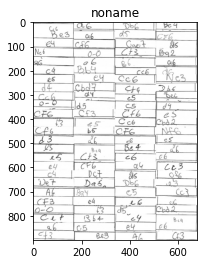

In [ ]:
show_image( _load_image( _all_images[0]))

In [ ]:
_all_labels=glob( '/content/carnaval_fullpage_shuffle_from_parts_5k_100lances/labels/*.pgn')
_all_labels.sort()
# _all_labels= _all_labels[0:LIMIT]

#ler todo o conteudo de labels e criar o vocabulario
_all_labels_content= [read_label( f) for f in _all_labels]
# _all_labels_content= [x.replace( 'x', '').replace( '+', '') for x in _all_labels_content]

#
# remove todos os + do label de resposta, poque a base nao esta consistente
#
if REMOVE_PLUS:
  print( "Remove +...")
  _all_labels_content= [x.replace( '+', '') for x in _all_labels_content]


Remove +...


In [ ]:
_all_captions = []
_all_img_name_vector = []

_all_labels_content_split= [label.split() for label in _all_labels_content]

_all_labels_content_split_truncated= [x[0:MAX_LENGTH] for x in _all_labels_content_split]

## Precisa? Vou testar sem
# _all_labels_content_split_truncated= [
#             np.pad( x, (0,MAX_LENGTH-len(x)), 'constant', constant_values= '<unk>') for x in _all_labels_content_split_truncated]

_all_captions_new= [" ".join( splitted) for splitted in _all_labels_content_split_truncated]

_all_labels_content_start_end= ['<start> ' + label + ' <end>' for label in _all_captions_new]

#transforma para o fomato esperado
_all_captions= _all_labels_content_start_end
_all_img_name_vector= _all_images

all_img_name_vector= _all_img_name_vector
all_captions= _all_captions

In [ ]:
for i in range( 0,10):
  print( len( _all_labels_content_split_truncated[i]))

100
100
100
100
100
100
100
100
100
100


In [ ]:
print( _all_labels_content_start_end[0:3])

['<start> Nc6 d6 Be3 a6 e4 Nf6 Nc6 O-O g6 e6 c4 Bb4 e5 e4 d4 Nbd7 Nc6 d4 O-O d5 Nf6 Nf3 f3 e5 Nf6 b5 d3 a6 e5 Bc4 e5 Ngf3 e4 Nf6 c4 Qc7 Qe7 Qa5 a6 Bg4 Nf3 e4 O-O f3 Ne7 Bb4 a6 c5 Nf3 Be3 Qb6 Bc4 d5 Nf6 Nge7 d5 Ngf3 Bg2 e6 a6 Nc6 d6 Nc6 Nc3 Nf6 Qb6 c5 Be6 c5 d4 Nf6 e5 Nc6 Nbd2 Nf6 Nf6 c6 c5 Bc4 a6 c6 c6 a4 Nc3 d5 Nf6 Qb6 e3 c5 Nc3 e6 c6 d5 Nbd2 c4 Bc4 e4 c6 a6 Nf3 <end>', '<start> b5 c4 Be7 Bb4 e4 O-O O-O d5 d4 d4 c5 Nf3 Qd2 e5 Be2 c5 Nf3 Bb4 Bg4 c5 Be2 e6 Nf6 Bb4 Bd7 Nc3 Nf6 Re1 d6 a4 e4 Bg2 Nf6 g6 Re8 Nbd7 Bc4 Nf3 Nbd7 c6 Nc6 Nge7 O-O O-O b5 e6 Nc6 e4 e4 e6 Nf6 c6 Bg7 d3 Bc4 Qb6 Nf6 Nc3 c3 Nf3 Nh5 d4 e4 Nc6 Bc4 Nf3 Be7 Nf3 Be7 Bb3 Bf4 Nc6 e6 Nbd2 c6 Ne7 Be3 d4 c3 d5 Be7 e4 c4 d5 d5 O-O d6 Bb3 Nf6 d6 Nc3 Nc3 O-O Bd6 e4 Ne5 Nc6 Nf3 Nf6 Ba7 <end>', '<start> d4 Re1 a6 d6 a6 Ne2 e5 c5 d3 Bc4 d5 c6 d5 c5 d3 d6 Be7 c5 O-O Nf3 Nf3 Bg4 Nf3 Bc4 Nf3 Qb6 Nf6 d3 Bg2 O-O e5 Bb4 c4 d3 Be3 Nf3 c3 Nf6 d6 b4 g6 Nc3 Nc6 O-O Qa5 a3 Nc6 Nf6 O-O Nc3 e5 Nf6 O-O Bf4 e5 c5 Nf3 O-O Be7 e6 d4 O-O e4 Nfd7 Bg7 Qc

In [ ]:
# Shuffle captions and image_names together
# Set a random state
train_captions, img_name_vector = shuffle(all_captions,
                                          all_img_name_vector,
                                          random_state=1)

# Select the first 30000 captions from the shuffled set
num_examples = len( train_captions) if LIMIT is None else LIMIT
train_captions = train_captions[:num_examples]
img_name_vector = img_name_vector[:num_examples]

4000
Bg2 Nc3 Nf3 a4 Bc4 Nd5 e4 e6 Nbd2 d5 b3 c5 Nf6 g6 d5 e4 Nbd2 e5 Bd6 Nc6 c4 Nfd7 d3 Bc4 Nf3 g6 e4 O-O e4 Nc3 d4 Re1 Nf3 Bb5 d6 Bg4 Bf3 d5 d4 Bg7 d6 Nc6 Qc2 Bg7 Bg7 Ng5 Bb7 d4 c5 Nc6 c3 d6 e4 O-O c6 Nc6 Nc3 Nf3 Qb3 c3 Nc6 Bf4 e4 d6 Nf6 Nc6 Bg7 d6 c5 Bf4 e6 Bb4 Qd2 Nf3 Nf6 Bc4 O-O d4 O-O Qb6 b3 O-O Qb3 d4 Nc6 a6 O-O Be3 g6 Nf3 g6 g6 Nc3 Nf3 d4 c4 d4 d4 e6 c6


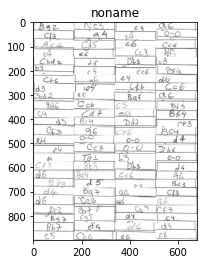

Nf3 d6 c5 Nf3 Nge7 Nc3 Nc6 d6 Nf6 c3 d5 e3 Qb6 Re1 a4 Be3 b5 Bb4 Nf3 Bb3 Be7 e5 Ba5 O-O e6 Bc4 b4 Nf6 e4 Nf6 a6 Be7 Be7 c5 Ba7 O-O d5 e3 Nf3 Nf3 d5 Nbd2 Nc3 Bb5 Nf6 e5 Bg2 Bb3 Nc6 d5 Nbd2 Nf6 Nf3 Ngf6 O-O g6 e3 Re8 Nc3 Nf6 O-O e4 e4 e6 Be3 O-O Nc3 Nc3 Bd3 Nf6 Nf3 Nc3 g6 a6 Bd3 Nf6 e6 c3 e5 Bg7 Nf6 O-O Bc5 Nc3 Bf4 Nf3 Qc7 e5 a3 Bb4 Bd7 c4 Nf3 Qb6 O-O e6 Bc4 d6 d4 Nf3


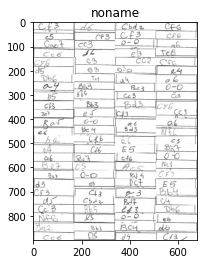

e3 Bb3 e4 d4 Be3 Nf6 c3 O-O Be7 d6 Nf6 e4 e4 Nc6 Nc6 Bb2 e4 Nc6 Bd3 b3 d6 Be2 Re1 c5 f3 e4 Bg7 d5 Nc6 O-O e4 Nf6 Bd6 d4 Qb6 Nbd7 Nc3 e5 e3 Bb3 O-O d5 a4 Nc6 e6 e4 O-O Re1 e6 e5 e5 c6 d5 a4 e6 Nc3 d6 Be7 c3 Nf3 c4 Nc6 Bb4 O-O e4 Bc5 Bb3 Be7 e4 Qb6 g6 e6 e4 Bc4 e5 e4 c5 d5 d5 O-O b5 Nc3 g6 a3 Nf3 b4 Re8 b5 Nc6 e6 a3 e4 Nf6 O-O Bc4 Nf3 Nf6 d5 Nc3 Nf3


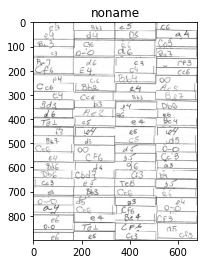

In [ ]:
print( len( train_captions))
for i in range( 0, 3):
  rid = np.random.randint(0, len(_all_labels_content))
  print( _all_labels_content[rid])
  show_image( _load_image( _all_images[rid]))

In [ ]:
print( _load_image( _all_images[3]).shape)

(900, 678, 3)


# Parte do xadrez <== FIM

In [ ]:
len(train_captions), len(all_captions)

(4000, 5000)

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (900, 678)) #(450, 339))  #original=(576, 678, 3)
    # img = tf.keras.applications.inception_v3.preprocess_input(img)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img, image_path

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


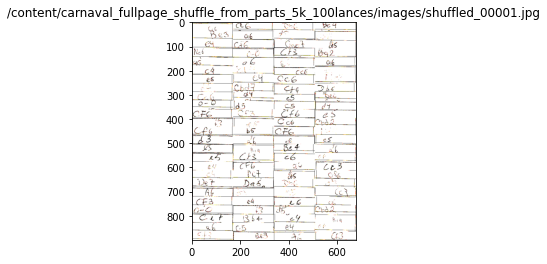

In [ ]:
img, path= load_image( _all_images[0])
show_image( img, path)

In [ ]:
# image_model = tf.keras.applications.InceptionV3(include_top=False,
#                                                 weights='imagenet',
#                                                 input_shape= (576, 678, 3))  # => generates (16, 19, 2048)
#                                                 # O input shape nao é obrigatorio, mas setando dá para
#                                                 # ver o tamanho do output
image_model = tf.keras.applications.VGG19(include_top=False,
                                                weights='imagenet',
                                                input_shape= (900, 678, 3))  # => generates (16, 19, 2048)
                                                # O input shape nao é obrigatorio, mas setando dá para
                                                # ver o tamanho do output
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
# -1 generates (None, 18, 21, 512)
attention_shape= (28,21)
features_shape = 512

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

In [ ]:
print( image_model.summary())

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 900, 678, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 900, 678, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 900, 678, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 450, 339, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 450, 339, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 450, 339, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 225, 169, 128)     0     

In [ ]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(8) #(16)

for img, path in image_dataset:
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

In [ ]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [ ]:
print( train_captions[0])

<start> Nc3 a6 c5 Bg7 Qb6 e4 Nc3 Nf3 Na5 Nc6 Nc6 Nf6 Nf3 a4 d4 Qb6 c4 e6 Nc3 Be7 Bg7 g6 d4 c6 Qd2 Nf3 c5 Nf3 Ba4 e5 Nc3 Qc7 d4 Nc3 c3 Qd2 Bg5 Ngf6 Bg7 d4 Nge7 e6 c4 d5 Na5 Nf6 c6 Nf6 e6 g3 b3 b5 Nf6 Nf3 e4 c6 Bb5 O-O Nc3 Bg4 O-O e4 Bg2 e6 c3 Bc4 Nc6 c5 d4 Bd3 Nf3 Nc3 c3 O-O Bb3 d4 e4 d3 c6 Be7 Nf3 Bd7 Nc3 Bd7 d4 Nf3 e4 Be7 d4 Nc3 Nc3 Bg4 Bg7 d6 O-O Be3 e5 a3 d4 Be3 <end>


In [ ]:
# # Choose the top 5000 words from the vocabulary
# top_k = 5000
# tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
#                                                   oov_token="<unk>",
#                                                   filters= ' ')
#                                                   # filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

# #force to always use a list with all words with 1 occurrence of each word
# tokenizer.fit_on_texts(train_captions)
# #tokenizer.fit_on_texts([" ".join( _unique_labels)])
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

In [ ]:
max_length

102

## Split the data into training and testing

In [ ]:
# Create training and validation sets using an 80-20 split
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.20,
                                                                    random_state=0)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(3200, 3200, 800, 800)

## Create a tf.data dataset for training


In [ ]:
# Feel free to change these parameters according to your system's configuration
BATCH_SIZE = 32
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
# vocab_size = top_k + 1
vocab_size= len(tokenizer.word_index)+1
num_steps = len(img_name_train) // BATCH_SIZE
num_steps_val = max( 1, len(img_name_val) // BATCH_SIZE)
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
attention_features_shape = attention_shape[0]*attention_shape[1]  #16*19   # 308

In [ ]:
# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
dataset_val = tf.data.Dataset.from_tensor_slices((img_name_val, cap_val))

# Use map to load the numpy files in parallel
dataset_val = dataset_val.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset_val = dataset_val.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset_val = dataset_val.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)
    # print( 'BahdanauAttention.features =>', features.shape) #(64, 64, 256), segundo 64=length(encoder_output)
    # print( 'BahdanauAttention.hidden =>', hidden.shape) #(64, 512)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    # print( 'BahdanauAttention.hidden_with_time_axis =>', hidden_with_time_axis.shape) #(64, 1, 512)

    # score shape == (batch_size, 64, hidden_size)
    score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis)) 
    # print( 'BahdanauAttention.score =>', score.shape)   #(64, 64, 512)

    # attention_weights shape == (batch_size, 64, 1)
    # you get 1 at the last axis because you are applying score to self.V
    attention_weights = tf.nn.softmax(self.V(score), axis=1)
    # print( 'BahdanauAttention.attention_weights =>', attention_weights.shape)  #(64, 64, 1) segundo 64 vem do tamanho da sequencia apos cnn

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    # print( 'BahdanauAttention.context_vector =>', context_vector.shape)  #(64, 64, 256) segundo 64= length(encoder_output)
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # print( 'BahdanauAttention.context_vector =>', context_vector.shape) #(64, 256)

    return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim, units):
        super(CNN_Encoder, self).__init__()
        self.units = units
        # shape after fc == (batch_size, 64, embedding_dim)

        # self.gru1= tf.keras.layers.GRU(self.units,
                                  #      dropout= ENCODER_DROPOUT,
                                  #  return_sequences=True) 
        self.bgru= tf.keras.layers.Bidirectional( tf.keras.layers.GRU(self.units,
                                       dropout= 0.1,
                                   return_sequences=True)) 
        self.drop= tf.keras.layers.Dropout( 0.2)
        # self.gru= tf.keras.layers.GRU(self.units,
        #                            return_sequences=True)
        self.fc = tf.keras.layers.Dense(self.units) #embedding_dim)

    def call(self, x):
        x = self.bgru( x)
        # x = self.bgru2( x)
        x = self.drop(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, 256) #embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   dropout= 0.1,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    # self.gru.trainable= False
    self.drop1= tf.keras.layers.Dropout( 0.2)
    self.drop2= tf.keras.layers.Dropout( 0.2)
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)
    # self.attention.trainable = False

  def call(self, x, features, hidden):
    # print( 'decoder.call=> ', x.shape, features.shape, hidden.shape) #(64, 1) (64, 64, 256) (64, 512)

    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)
    # print( 'decoder.attention=> ', context_vector.shape, attention_weights.shape) #(64, 256) (64, 64, 1)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)
    # print( 'decoder.embedding=> ', x.shape) #(64, 1, 256)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
    # print( 'decoder.concat=> ', x.shape) #(64, 1, 512)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)
    # print( 'decoder.gru=> ', output.shape, state.shape) #(64, 1, 512) (64, 512)

    output = self.drop1(output)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)    #fc1= Dense( 512)
    # print( 'decoder.fc1=> ', x.shape) #(64, 1, 512)

    # x shape == (batch_size * max_length, hidden_size), max_length=1 porque é passo a passo
    x = tf.reshape(x, (-1, x.shape[2])) 
    # print( 'decoder.reshape=> ', x.shape)  # (64, 512)

    # x = self.drop2(x)

    # output shape == (batch_size * max_length, vocab), max_length=1 porque é passo a passo
    x = self.fc2(x) #fc2= Dense(5000)
    # print( 'decoder.fc2=> ', x.shape)  #(64, 5001)    

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:
encoder = CNN_Encoder(embedding_dim, units)
# encoder.trainable = False

decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  # print( 'loss_function.real, pred', real.shape, pred.shape)  #(64,) (64, 5001)
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## Checkpoint

#Dá para salvar checkpoint no google drive?

In [ ]:
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)

# se for refinamento, parte do pretraining 
if not checkdir_pre is None:
  checkpoint_pre_path = "/content/drive/My Drive/mestrado/"+checkdir_pre+"/checkpoints/train"
  if tf.train.latest_checkpoint(checkpoint_pre_path):
    print( "Carrega pretraining..")
    ckpt.restore( tf.train.latest_checkpoint(checkpoint_pre_path))


checkpoint_path = "/content/drive/My Drive/mestrado/"+checkdir+"/checkpoints/train"
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=1)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  print( "checkpoint found!")
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  print( 'start_epoch= ', start_epoch)
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)
else:
  print( "checkpoint NOT found!")

Carrega pretraining..
checkpoint NOT found!


## Training



In [ ]:
TRAIN_LENGTH= 10

In [ ]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []
loss_plot_val = []

In [ ]:
@tf.function
def train_step(img_tensor, target, TRAIN_LENGTH):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, TRAIN_LENGTH): #<==
      # for i in range(1, target.shape[1]): #<==
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(TRAIN_LENGTH))
  # total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
def train_loop_once():
  # global start_epoch
  # global t_last_saved

  # EPOCHS = start_epoch+ _n
  # print( start_epoch, '=>', EPOCHS, " loss_target=>", loss_target)
  # for epoch in range(start_epoch, EPOCHS):
  start = time.time()
  total_loss = 0

  for (batch, (img_tensor, target)) in enumerate(dataset):
      print( 'target.shape[1]', target.shape[1], 'target.shape', target.shape)
      print( 'img_tensor.shape[1]', img_tensor.shape[1], 'img_tensor.shape', img_tensor.shape)
      batch_loss, t_loss = train_step(img_tensor, target, TRAIN_LENGTH)
      print ('Train Loss {:.4f}'.format(batch_loss.numpy() / int(TRAIN_LENGTH)))
      break
          
  for (batch, (img_tensor, target)) in enumerate(dataset_val):
      print( 'target.shape[1]', target.shape[1], 'target.shape', target.shape)
      print( 'img_tensor.shape[1]', img_tensor.shape[1], 'img_tensor.shape', img_tensor.shape)
      batch_loss, t_loss = test_step(img_tensor, target, TRAIN_LENGTH)

      print ('Validation Loss {:.4f}'.format(batch_loss.numpy() / int(TRAIN_LENGTH)))
      break

#train_loop_once()

In [ ]:
@tf.function
def test_step(img_tensor, target, TRAIN_LENGTH):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
  features = encoder(img_tensor)

  # print( 'target.shape[1]', target.shape[1], 'target.shape', target.shape)
  for i in range(1, TRAIN_LENGTH): #<==
  # for i in range(1, target.shape[1]): #<==
      # passing the features through the decoder
      predictions, hidden, _ = decoder(dec_input, features, hidden)
      loss += loss_function(target[:, i], predictions)

      # using teacher forcing
      # testa com teacher forcing, para testar nas mesmas condicoes de treinamento
      # embora na predicao seja diferente
      dec_input = tf.expand_dims(target[:, i], 1) 
      # dec_input = tf.random.categorical(predictions, 1)

  total_loss = (loss / int(TRAIN_LENGTH))
  # total_loss = (loss / int(target.shape[1]))
  return loss, total_loss

In [ ]:
t_last_saved= time.time()

In [ ]:
def train_more_for_length( new_length, _n, loss_target= 0):
  global TRAIN_LENGTH
  if not new_length is None:
    TRAIN_LENGTH= new_length
    print( "train length", TRAIN_LENGTH)

  train_more( _n, loss_target)

def train_more( _n, loss_target= 0):
  global TRAIN_LENGTH
  global start_epoch
  global t_last_saved

  EPOCHS = start_epoch+ _n
  print( start_epoch, '=>', EPOCHS, " loss_target=>", loss_target)
  for epoch in range(start_epoch, EPOCHS):
      start = time.time()
      total_loss = 0

      for (batch, (img_tensor, target)) in enumerate(dataset):
          batch_loss, t_loss = train_step(img_tensor, target, TRAIN_LENGTH)
          total_loss += t_loss

          if batch % 50 == 0:
              print ('Epoch {} Batch {} Loss {:.4f}'.format(
                epoch + 1, batch, batch_loss.numpy() / TRAIN_LENGTH))
#                epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
      # storing the epoch end loss value to plot later
      loss_plot.append(total_loss / num_steps)

      if ((time.time() - t_last_saved)> SAVE_INTERVAL):     #salva a cada 15 minutos
        print( "save...")
        ckpt_manager.save()  
        t_last_saved= time.time()

      #
      # validation loop
      #
      total_loss_val = 0
      for (batch, (img_tensor, target)) in enumerate(dataset_val):
          batch_loss, t_loss = test_step(img_tensor, target, TRAIN_LENGTH)
          total_loss_val += t_loss
      # storing the epoch end loss value to plot later
      loss_plot_val.append(total_loss_val / num_steps_val)

      print ('Epoch {} Loss {:.6f} [ Validation Loss {:.6f} ]'.format(epoch + 1,
                                          total_loss/num_steps, total_loss_val/num_steps_val))
      print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

      if loss_target> 0 and (total_loss/num_steps)<= loss_target:
        print( "Target reached! stop!")
        break

  start_epoch= EPOCHS
  ckpt_manager.save()  

  plt.plot(loss_plot)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.plot(loss_plot_val)
  plt.title('Loss Plot')
  plt.gca().legend(('train loss','validation loss'))
  plt.show()

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    print( 'max_length', max_length)
    for i in range(TRAIN_LENGTH): #<==
    # for i in range(max_length): #<==
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [ ]:
def plot_attention(image, result, attention_plot, expected= None):
    temp_image = np.array(Image.open(image))

    # fig = plt.figure(figsize=(50, 50))
    fig = plt.figure(figsize=(50, 50))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], attention_shape) #(8, 8))  # 8x19
        # ax = fig.add_subplot(4, 9, l+1)
        ax = fig.add_subplot(8, 9, l+1)
        if expected is None or l>= len( expected):
          ax.set_title(result[l], fontsize= 40)
        else:
          ax.set_title(result[l]+" ("+expected[l]+")", fontsize= 40)
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

In [ ]:
def evaluate_train(n):
  for i in range(0, n):
    # captions on the validation set
    rid = np.random.randint(0, len(img_name_train))
    image = img_name_train[rid]
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_train[rid] if i not in [0]])
    result, attention_plot = evaluate(image)

    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', ' '.join(result))
    plot_attention(image, result, attention_plot, real_caption.split()[1:])

def evaluate_val(n):
  for i in range(0, n):
    # captions on the validation set
    rid = np.random.randint(0, len(img_name_val))
    image = img_name_val[rid]
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
    result, attention_plot = evaluate(image)

    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', ' '.join(result))
    plot_attention(image, result, attention_plot, real_caption.split()[1:])

train length 40
0 => 200  loss_target=> 0.1
Epoch 1 Batch 0 Loss 0.0317
Epoch 1 Batch 50 Loss 0.0170
Epoch 1 Loss 0.022509 [ Validation Loss 4.756892 ]
Time taken for 1 epoch 214.78057742118835 sec

Target reached! stop!


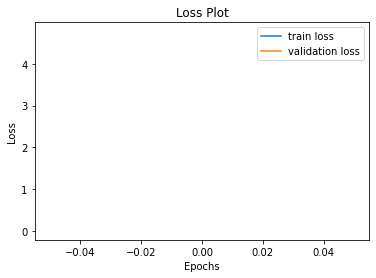

max_length 102
Real Caption: <start> nb3 bb2 nf3 e6 nbd7 qb6 nf6 c6 ne2 bg2 g6 nc6 o-o g6 bg7 bb4 d4 e4 c3 g6 bg5 bg7 bf4 nc3 b3 a3 qb3 d5 a6 c4 nc6 d5 e5 a6 a3 h3 e6 re1 be2 c4 nf6 e6 e3 nc3 nc3 nf3 d5 e5 c3 b3 d6 e4 e4 c6 ne5 c5 a4 o-o e5 nf6 nf6 o-o bg7 nd4 nb4 e4 d5 bb4 nf3 nf6 e6 e4 d5 nc6 d4 d5 c6 e6 nf3 nc6 d4 d4 nf3 ne2 e5 bb5 qb6 e4 g6 e5 c3 bd6 d3 o-o nc3 e4 o-o o-o e4 c5 <end>
Prediction Caption: nb3 bb2 nf3 e6 nbd7 qb6 nf6 c6 ne2 bg2 g6 nc6 o-o g6 bg7 bb4 d4 e4 c3 g6 bg5 bg7 bf4 nc3 b3 a3 qb3 d5 a6 c4 nc6 d5 e5 a6 a3 h3 e6 re1 be2 re1


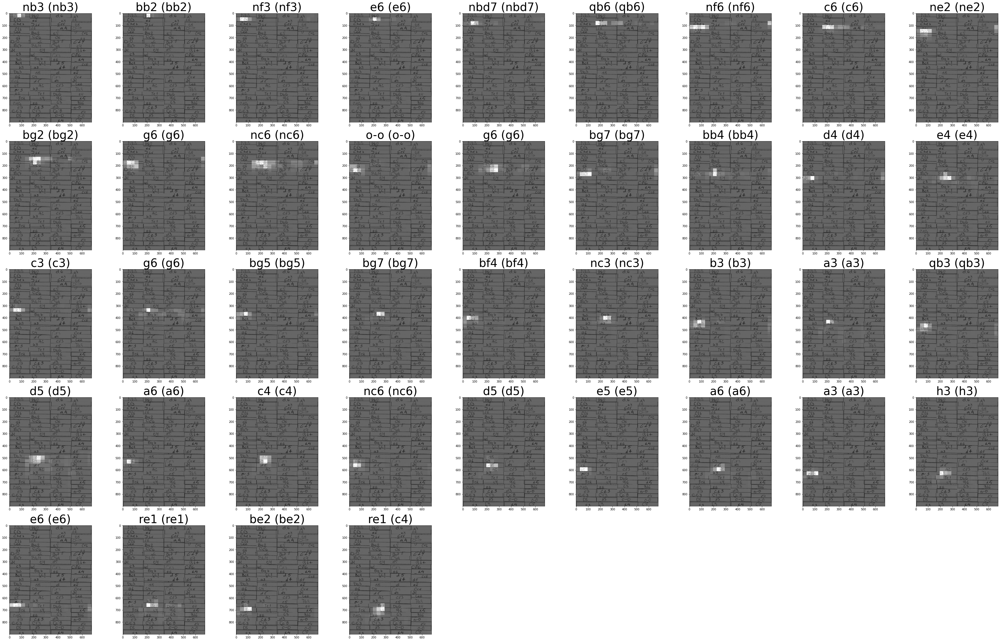

max_length 102
Real Caption: <start> bf3 d4 a4 a6 nf6 o-o bf4 e4 g6 nc3 e3 o-o c3 qc2 d4 o-o d4 e6 nf6 o-o d4 d4 c5 ng5 nc3 e4 nf3 o-o nf3 nf6 d5 ngf3 e6 nf6 b4 nf3 be7 c5 o-o d4 nc6 c5 d4 o-o nd2 nd5 c4 qc2 e3 bc4 nf3 d4 h6 nf6 d5 bb3 nd5 d4 b5 be7 bc4 a6 nc3 c3 b5 nc6 o-o nd5 e3 c4 o-o qd2 nf3 d4 be6 bd7 bg7 o-o nc6 be3 bb5 b4 nd2 bg4 o-o nf3 e5 nc6 nf6 nf6 nf3 d4 b3 o-o bg2 c3 bg5 e4 nf6 nc3 <end>
Prediction Caption: bd3 d4 c3 a6 nf6 d5 nf6 e5 nf6 e4 e3 nf3 c3 o-o c4 c3 d4 o-o e4 d6 d4 o-o c5 d4 c5 nc6 nbd2 g6 nf3 o-o nf3 ngf3 d6 ngf3 e6 nf6 b4 nf3 qb3 b3


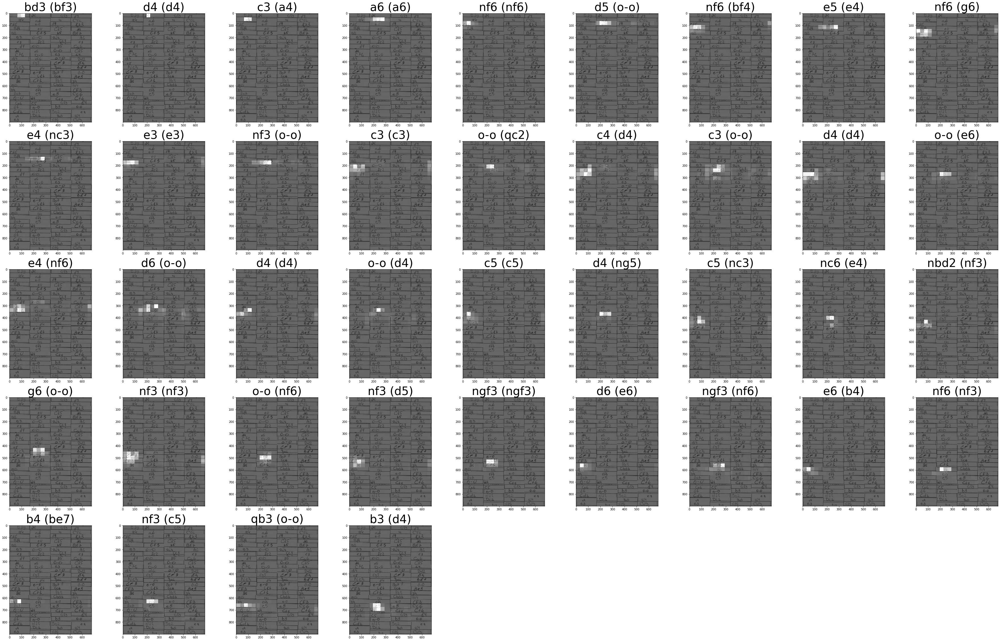

train length 45
200 => 400  loss_target=> 0.1
Epoch 201 Batch 0 Loss 0.0633
Epoch 201 Batch 50 Loss 3.4627
Epoch 201 Loss 2.726630 [ Validation Loss 3.471713 ]
Time taken for 1 epoch 231.7571485042572 sec

Epoch 202 Batch 0 Loss 2.6225
Epoch 202 Batch 50 Loss 1.7306
Epoch 202 Loss 1.835284 [ Validation Loss 2.816079 ]
Time taken for 1 epoch 198.16131234169006 sec

Epoch 203 Batch 0 Loss 1.1626
Epoch 203 Batch 50 Loss 0.9138
Epoch 203 Loss 1.021149 [ Validation Loss 2.885710 ]
Time taken for 1 epoch 197.0396568775177 sec

Epoch 204 Batch 0 Loss 0.7878
Epoch 204 Batch 50 Loss 0.5769
Epoch 204 Loss 0.682104 [ Validation Loss 3.087140 ]
Time taken for 1 epoch 197.21239614486694 sec

Epoch 205 Batch 0 Loss 0.5789
Epoch 205 Batch 50 Loss 0.5835
Epoch 205 Loss 0.635666 [ Validation Loss 3.106221 ]
Time taken for 1 epoch 198.28563284873962 sec

Epoch 206 Batch 0 Loss 0.6079
Epoch 206 Batch 50 Loss 0.4561
Epoch 206 Loss 0.443485 [ Validation Loss 3.285290 ]
Time taken for 1 epoch 196.2464306354

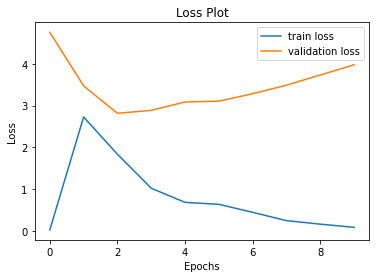

max_length 102
Real Caption: <start> e4 bg7 bc4 d5 o-o e4 qb6 e3 nd5 bg7 c5 d5 bd7 ba7 ne5 bc4 qd2 nc6 e6 bg7 bg5 nc6 d4 e3 d5 g6 re1 d5 c5 bc5 bg7 bd3 e6 be7 c6 bd6 bd7 nbd2 g6 nh5 bb7 e6 nf3 nf6 nc6 o-o nc6 e3 d4 d4 c5 o-o o-o g6 nf6 re8 e5 d3 d5 nf3 nf6 nc6 nf3 g3 nf3 a6 bg7 o-o nc6 nc6 nbd7 bb3 a6 c6 qc2 nc3 c6 f5 c5 d6 c5 e4 bc4 be7 nc6 nf6 e4 be7 nd2 be7 e5 qe7 nf3 be7 bc4 d5 bg7 e6 d5 e6 <end>
Prediction Caption: e4 bg7 bc4 d5 o-o e4 qb6 e3 nd5 bg7 c5 d5 bd7 ba7 ne5 bc4 qd2 nc6 e6 bg7 bg5 nc6 d4 e3 d5 g6 re1 d5 c5 bc5 bg7 bd3 e6 be7 g6 bd6 bd7 nbd2 g6 nh5 bb7 d3 bf3 nf6 nc3


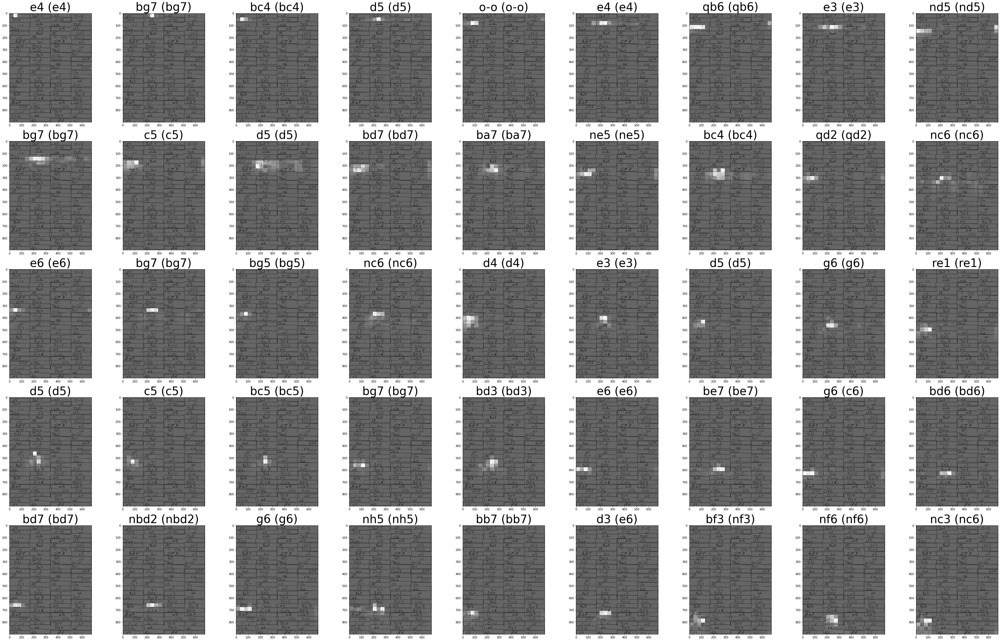

max_length 102
Real Caption: <start> a6 bb2 g6 d5 g6 o-o be3 nf6 be3 o-o c4 d6 nf3 c5 bg4 nf3 bf3 be7 c5 a6 a3 a6 nf6 be3 nc3 c6 re8 o-o e5 e4 b5 b3 nc3 nbd7 d5 nc6 d4 nbd2 be3 nc3 nc6 nf6 c3 nc6 bg2 be6 e6 nc3 o-o bd6 c5 re1 e5 d4 e4 bb2 d4 bd6 g6 c3 e6 o-o c5 c3 nd2 d5 nf3 a4 e4 nc6 o-o nf6 be2 c5 g6 nc3 qd2 e6 be7 a6 nf3 c5 o-o o-o a6 nf3 nc6 c4 b5 d6 e4 nf3 bg2 a6 c4 d4 bc4 ba5 d6 d6 <end>
Prediction Caption: a6 bb2 o-o b3 g6 o-o be3 o-o be3 o-o d3 e6 bg7 e6 be7 nf3 bc5 be7 d3 d6 nf6 d4 e5 b5 qb6 o-o d3 e5 e5 bf4 nc3 e4 d5 nbd7 nf3 nf6 e4 be3 nc3 nc6 nc6 e6 nc6 nf6 nc3


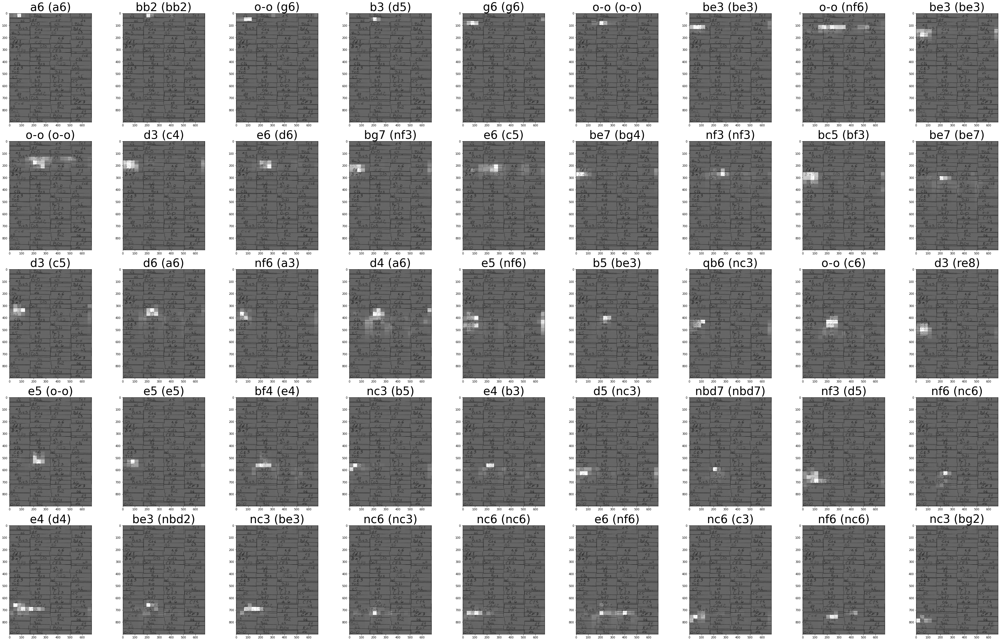

train length 48
400 => 600  loss_target=> 0.1
Epoch 401 Batch 0 Loss 0.3159
Epoch 401 Batch 50 Loss 0.1868
Epoch 401 Loss 0.203271 [ Validation Loss 3.956544 ]
Time taken for 1 epoch 235.1044044494629 sec

Epoch 402 Batch 0 Loss 0.1653
Epoch 402 Batch 50 Loss 0.1493
Epoch 402 Loss 0.140639 [ Validation Loss 4.148766 ]
Time taken for 1 epoch 199.87039875984192 sec

Epoch 403 Batch 0 Loss 0.1193
Epoch 403 Batch 50 Loss 0.1173
Epoch 403 Loss 0.109515 [ Validation Loss 4.398690 ]
Time taken for 1 epoch 200.13184928894043 sec

Epoch 404 Batch 0 Loss 0.1055
Epoch 404 Batch 50 Loss 0.0854
Epoch 404 Loss 0.080949 [ Validation Loss 4.522676 ]
Time taken for 1 epoch 198.75947856903076 sec

Target reached! stop!


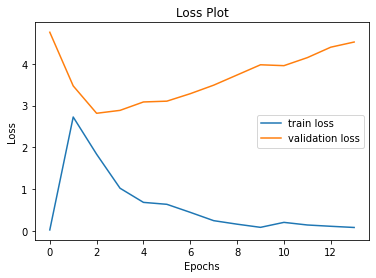

max_length 102
Real Caption: <start> c6 g6 bb3 d3 nf3 e6 nd4 nc6 qd2 g6 o-o e5 be7 d4 e5 nc6 bg2 bb3 h3 nf6 nf3 qb6 e4 bc4 bd7 e6 d6 c5 e5 c6 g6 nc6 d4 nf3 bf4 nc3 be7 b5 c5 e5 ng5 d4 e5 nc6 d4 e3 nc6 d6 nf3 nc3 nf6 c6 e5 nf6 nc3 nf6 bb3 c4 nd5 bf4 e6 nbd2 nc6 be3 be3 be2 c5 c5 d5 o-o qa5 d4 nf3 c3 d5 d5 nc6 o-o bb4 nf6 e4 c5 d5 qb6 d3 a6 h3 a6 d3 b4 b5 nf6 d3 qe7 bc5 o-o nf3 e6 nbd2 bc5 <end>
Prediction Caption: c6 g6 bb3 d3 nf3 e6 nd4 nc6 qd2 g6 o-o e5 be7 d4 e5 nc6 bg2 bb3 h3 nf6 nf3 qb6 e4 bc4 bd7 e6 d6 c5 e5 c6 g6 nc6 d4 nf3 bf4 nc3 be7 c5 e5 nf3 ng5 nc3 e5 d6 o-o nc6 nc6 d6


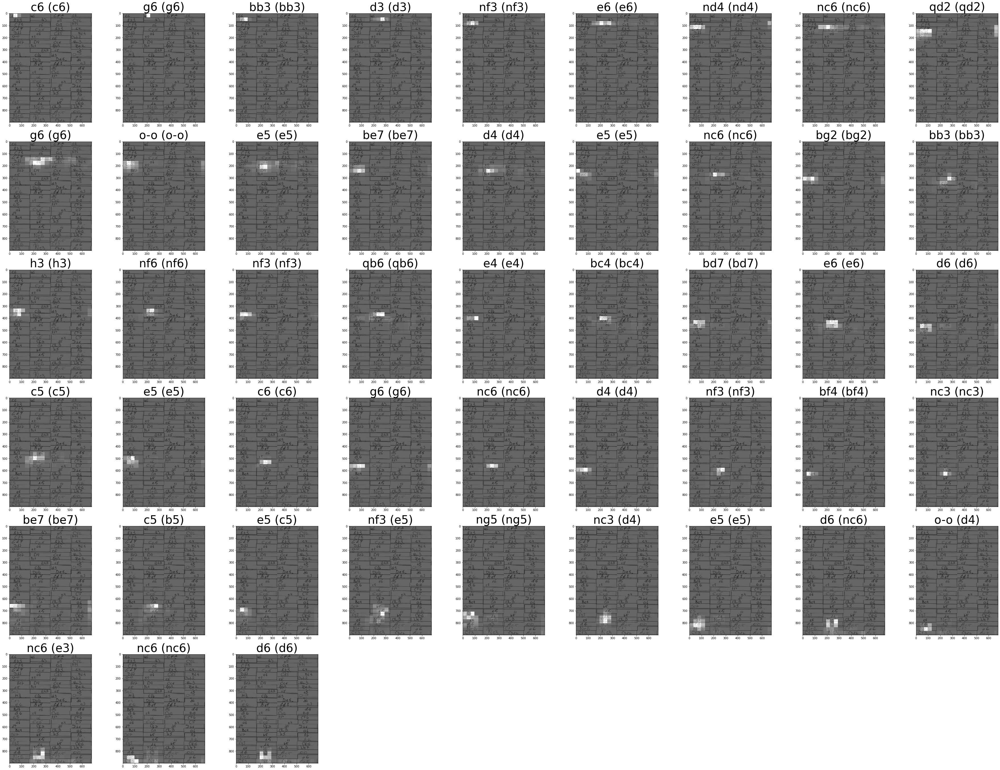

max_length 102
Real Caption: <start> d4 qd2 nf3 nf3 nf6 o-o c5 e5 ngf6 bd3 c4 b3 h3 bc4 o-o nc3 e5 nc3 e3 re1 a4 nf6 ba4 nf6 a6 a6 e5 nf3 c6 d4 o-o d6 nc3 nf6 ngf3 f3 nc3 nf6 c5 nc6 nf6 nf3 ba5 e3 b5 bf4 g6 bc4 nc6 d4 nc3 nbd2 e4 a3 c6 bg7 bc5 g6 e6 e3 nf3 a6 c4 nf3 nf3 o-o a4 g6 c4 nc6 c6 a4 nc3 be3 bd7 bg7 a3 b3 bg2 d4 bf5 nc6 o-o o-o d4 c4 g6 d6 nc6 nc6 be3 c5 bd7 c3 nc3 nbd2 be6 bg2 e6 e6 <end>
Prediction Caption: c4 nd2 nf3 c6 nf6 o-o nf6 be7 o-o b3 h3 a3 o-o bc4 e5 nc3 nc3 c5 a4 g6 g6 nf6 e5 nf6 a6 a6 e5 d3 o-o d4 bg4 d5 nb4 f3 nc3 nf6 e5 be7 nf6 bf4 e5 e5 d5 bf4 be7 d4 d5 d4


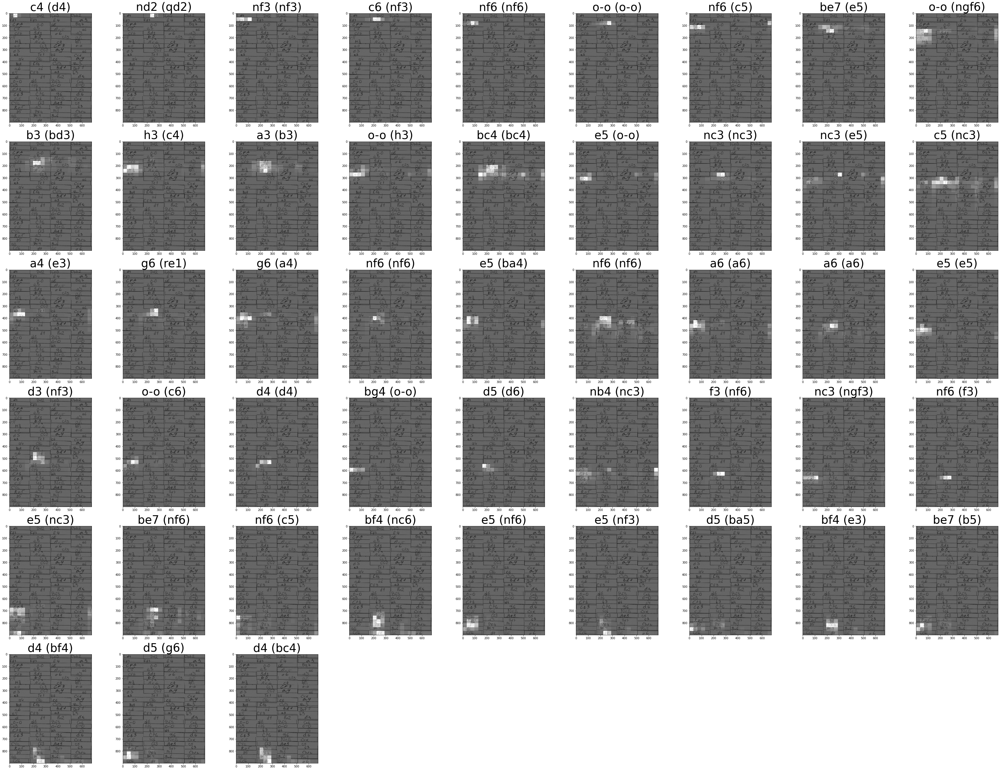

In [ ]:
for _len in [40,45,48]:
  train_more_for_length( _len, MAX_EPOCH, 0.1)
  evaluate_train(1)
  evaluate_val(1)

train length 49
600 => 800  loss_target=> 0.1
Epoch 601 Batch 0 Loss 0.2007
Epoch 601 Batch 50 Loss 0.2292
Epoch 601 Loss 0.224100 [ Validation Loss 4.341291 ]
Time taken for 1 epoch 235.37756323814392 sec

Epoch 602 Batch 0 Loss 0.1504
Epoch 602 Batch 50 Loss 0.8696
Epoch 602 Loss 0.821215 [ Validation Loss 3.681299 ]
Time taken for 1 epoch 199.77547883987427 sec

Epoch 603 Batch 0 Loss 1.4143
Epoch 603 Batch 50 Loss 0.7248
Epoch 603 Loss 0.852713 [ Validation Loss 3.926574 ]
Time taken for 1 epoch 199.456396818161 sec

Epoch 604 Batch 0 Loss 1.0933
Epoch 604 Batch 50 Loss 2.2488
Epoch 604 Loss 2.515038 [ Validation Loss 3.410365 ]
Time taken for 1 epoch 199.8799798488617 sec

Epoch 605 Batch 0 Loss 2.4208
Epoch 605 Batch 50 Loss 1.7011
Epoch 605 Loss 1.597731 [ Validation Loss 2.938072 ]
Time taken for 1 epoch 200.08582878112793 sec

Epoch 606 Batch 0 Loss 0.8824
Epoch 606 Batch 50 Loss 0.8592
Epoch 606 Loss 0.859651 [ Validation Loss 3.073518 ]
Time taken for 1 epoch 200.08040022850

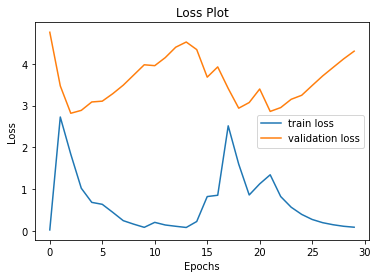

max_length 102
Real Caption: <start> b3 nf3 o-o o-o c3 nc3 bb7 nc6 d4 nf6 ba5 bc5 c4 c3 o-o b4 e5 bb4 nf6 d3 e4 c6 nc6 d5 nc6 nf6 d6 qb6 d6 e6 c5 e5 nc3 e6 nc6 c4 be3 h6 nf3 bg2 d4 bd7 nbd7 be2 bc4 o-o c3 nf3 nf3 nf3 d4 nbd2 nc3 ba4 d4 nf6 c4 bb7 a4 b3 e6 nf6 e4 nc6 nc3 o-o e5 d5 nf6 o-o e6 o-o nf3 be7 nf3 nf3 nbd7 o-o bg5 e4 c5 nh5 nc6 bd3 nc3 d5 nf3 be3 e5 nc6 ba4 c5 c5 o-o d4 d5 c6 c3 nc3 e6 <end>
Prediction Caption: b3 nf3 o-o o-o c3 nc3 bb7 nc6 d4 nf6 ba5 bc5 c4 c3 o-o b4 e5 bb4 nf6 d3 e4 c6 nc6 d5 nc6 nf6 d6 qb6 d6 e6 c5 e5 nc3 e6 nc6 c4 be3 h6 nf3 bg2 d4 bd7 nbd7 be2 bc4 o-o c3 nf3 e4


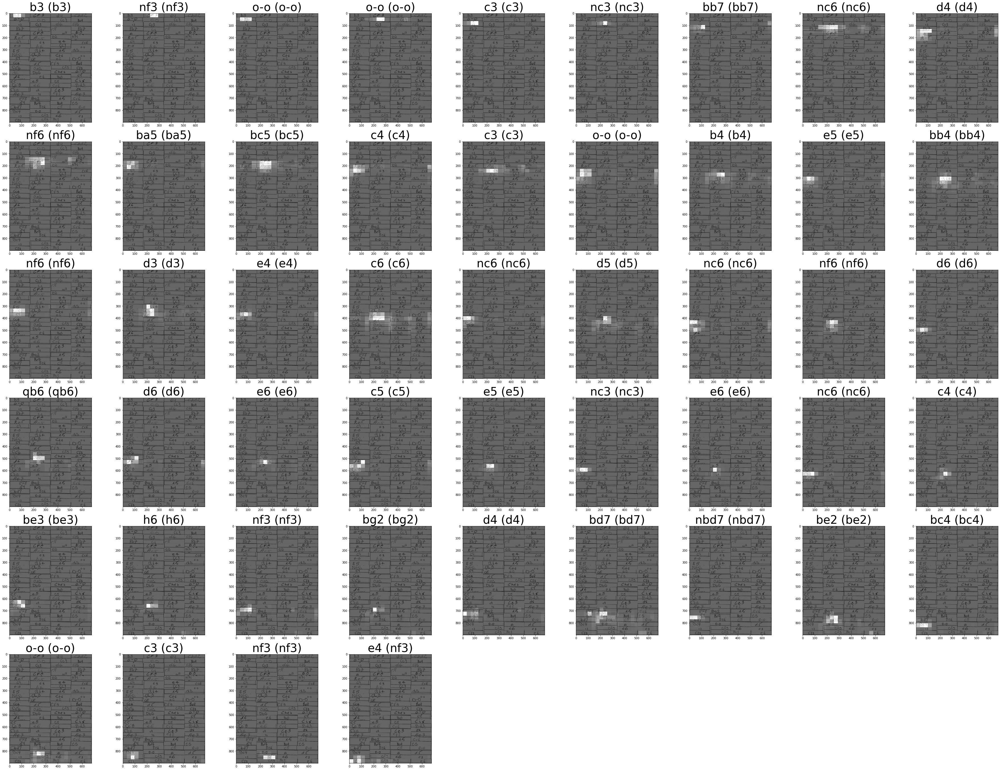

max_length 102
Real Caption: <start> nc3 nf3 e4 be6 c5 d4 bg7 d4 e5 nf6 nc6 bb2 e4 be7 nf3 bb4 nf6 nc3 e4 o-o nf3 f3 a4 e3 bg7 d5 qc2 h3 d5 h3 qe7 nc3 c5 bd3 nf3 bg2 d5 c6 re1 e4 c3 bg7 nf6 re1 g3 nd5 be3 c5 d4 nc6 bb5 bg7 d4 nc3 h3 nc3 d6 nf3 e5 d4 d4 o-o e6 nf6 nge7 qe7 nbd7 d5 o-o d4 c3 c5 e5 e4 d6 o-o d4 be2 nf6 nf6 nc3 ne7 c3 be7 b5 e4 bd7 nf3 c3 d4 d3 nc3 e3 nf6 c5 nf6 nf3 nbd2 bf4 e5 <end>
Prediction Caption: nc3 nf3 d4 d6 d4 d4 nf6 d4 b3 nf6 e5 nd2 nf3 be6 d4 bb5 nf3 bb4 nf6 nc3 e4 o-o d4 f3 nf3 c5 b3 nc3 b3 h3 be7 nc3 c5 b5 nf3 be7 re1 c6 c3 be7 re1 be7 nf3 nf6 be3 nf6 d5 d4 nf6


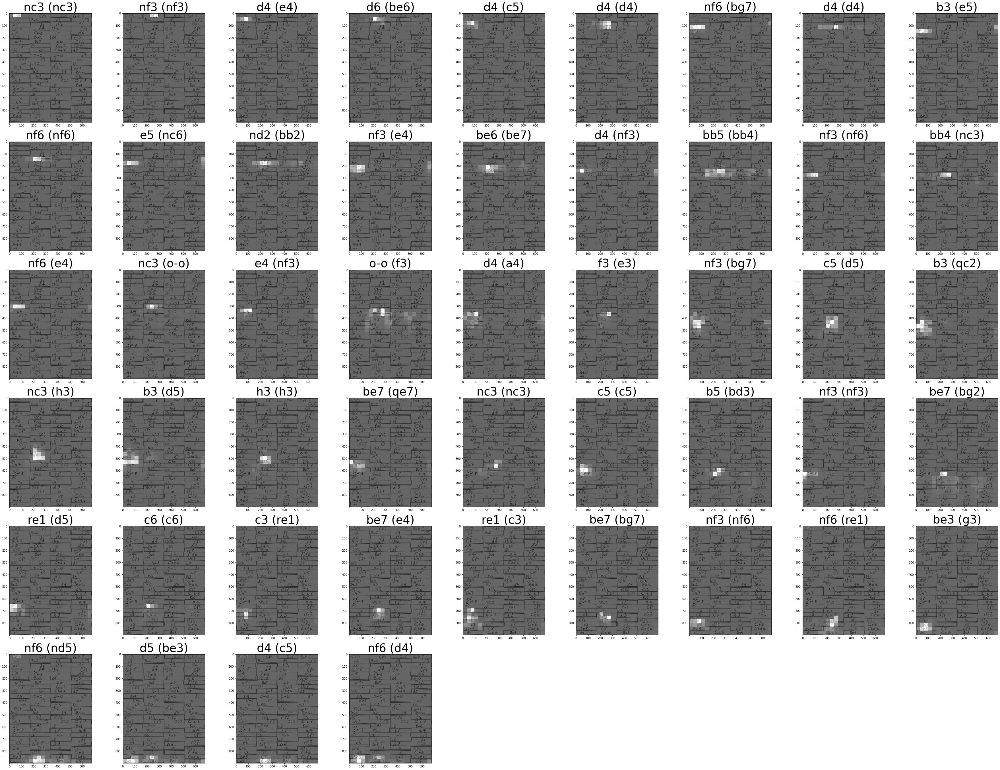

train length 50
800 => 1000  loss_target=> 0.1
Epoch 801 Batch 0 Loss 0.2190
Epoch 801 Batch 50 Loss 0.1940
Epoch 801 Loss 0.202317 [ Validation Loss 4.176944 ]
Time taken for 1 epoch 238.35552597045898 sec

Epoch 802 Batch 0 Loss 0.1516
Epoch 802 Batch 50 Loss 0.1623
Epoch 802 Loss 0.157040 [ Validation Loss 4.358143 ]
Time taken for 1 epoch 201.10617518424988 sec

Epoch 803 Batch 0 Loss 0.1738
Epoch 803 Batch 50 Loss 0.1200
Epoch 803 Loss 0.139542 [ Validation Loss 4.494265 ]
Time taken for 1 epoch 200.72229552268982 sec

Epoch 804 Batch 0 Loss 0.0994
Epoch 804 Batch 50 Loss 0.1226
Epoch 804 Loss 0.115174 [ Validation Loss 4.572582 ]
Time taken for 1 epoch 200.30458879470825 sec

Epoch 805 Batch 0 Loss 0.0755
Epoch 805 Batch 50 Loss 0.1315
save...
Epoch 805 Loss 0.117283 [ Validation Loss 4.715324 ]
Time taken for 1 epoch 201.1884241104126 sec

Epoch 806 Batch 0 Loss 0.0766
Epoch 806 Batch 50 Loss 0.1201
Epoch 806 Loss 0.141282 [ Validation Loss 4.660240 ]
Time taken for 1 epoch 200.

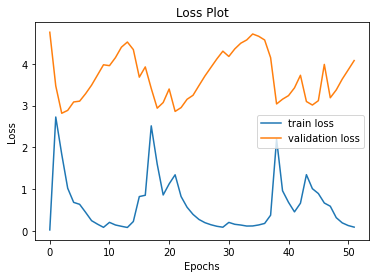

max_length 102
Real Caption: <start> g6 bg7 nc3 nf6 be3 e5 ne2 bc5 be3 nc3 be3 nc3 nf6 nc6 e6 nf3 nf6 c6 bc4 nf3 na6 b3 nc6 g6 be3 nf6 nc3 bg7 d5 qb6 e5 bc4 nge7 a6 nc3 nc6 be7 bg7 nc3 e6 d5 nf6 be7 be6 bd7 d4 bg2 nc6 be7 nc6 nc3 qc2 nc3 bg4 c5 o-o bd7 e4 o-o nc6 c6 nf3 e5 a6 nc6 e6 d5 d4 e5 bc4 be6 c3 nc6 c4 o-o d5 nfd7 bb4 d6 nc3 g6 nc6 d5 d6 o-o bg7 nf6 o-o o-o nc3 e4 bf4 d5 c4 d3 nc6 d6 bb4 nc6 c5 <end>
Prediction Caption: g6 bg7 nc3 nf6 be3 e5 ne2 bc5 be3 nc3 be3 nc3 nf6 nc6 e6 nf3 nf6 c6 bc4 nf3 na6 b3 nc6 g6 be3 nf6 nc3 bg7 d5 qb6 e5 bc4 nge7 a6 nc3 nc6 be7 bg7 nc3 e6 d5 nf6 be7 be6 bd7 d4 bg2 nc6 be7 nc6


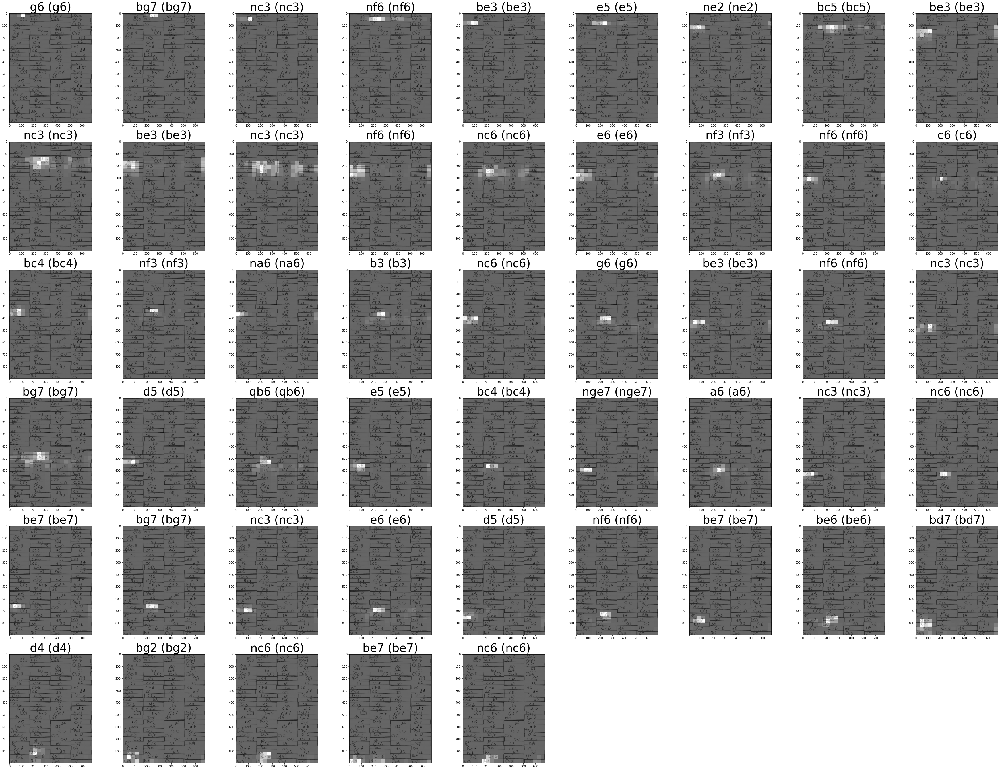

max_length 102
Real Caption: <start> nc6 e4 qc2 nc6 o-o e4 e6 nc6 nc6 d6 bb2 e4 c5 e4 bc5 nf6 e4 c4 d4 d4 e6 e4 c6 nf6 d5 c5 bc4 e5 d3 nf3 ng5 nf3 be7 nf3 nf3 na5 o-o e6 nf6 c5 na5 d4 e3 nc3 b5 d6 bg7 nf3 be2 o-o d5 e6 be2 e3 nf6 nd5 b4 e4 d6 e5 b3 nc3 d5 qa5 d5 na5 d3 e3 e6 be3 qd2 bc4 nc3 g6 d5 bf3 d4 c4 d6 nf3 b5 a4 nc3 d5 f3 d4 c5 d5 e4 d4 e6 d5 bc4 nc3 nc6 nf6 ba5 nc6 be6 e6 <end>
Prediction Caption: nc6 e4 o-o nf6 o-o e4 e6 e4 nc6 d5 nc6 e4 c3 e4 be7 nf6 e4 e4 d4 nc6 g6 nc6 g6 d5 e4 d5 bc4 e5 be7 c3 be7 d4 nf6 re8 e4 c5 nc6 bb5 c6 d4 e5 nc6 be3 nc3 e4 nf6 bb5 re8 e4 nc3


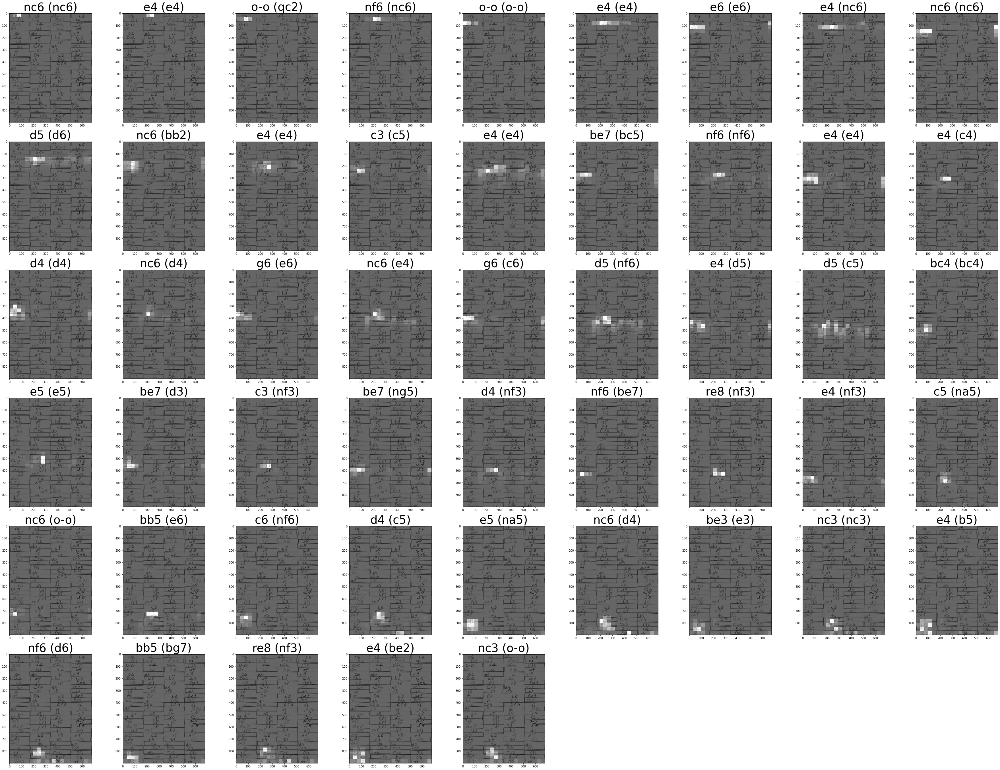

In [ ]:
for _len in [49,50]:
  train_more_for_length( _len, MAX_EPOCH, 0.1)
  evaluate_train(1)
  evaluate_val(1)